# Task-4B Data Compression using Matrix Factorization

Consider an image patch of size (50x50) that you want to compress using matrix factorization. To do this, you'll split the patch [N×N] into two smaller matrices of size [N×r] and [r×N] using matrix factorization. Compute the compressed patch by multiplying these two matrices and compare the reconstructed image patch with the original patch. 
Consider the following three cases-

- a patch with mainly a single color.
- a patch with 2-3 different colors.
- a patch with at least 5 different colors.

Test different values for the low-rank r=[5,10,25,50]. Use Gradient Descent to learn the compressed matrices. Display the reconstructed image patches, keeping the original pixel values outside the patch unchanged, and use your compressed matrix for the patch to show how well the reconstruction works.


### Importing Required Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import preprocessing
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [80]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
device = torch.device( "cpu")

In [81]:
# Setting the seed for Python, NumPy, and PyTorch (both CPU and GPU)
def set_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True  # Ensures deterministic behavior
    torch.backends.cudnn.benchmark = False     # Disables the auto-tuner that finds the best algorithm

set_seed(42)

### Loading the image

In [82]:
# Load and preprocess image
img = torchvision.io.read_image("./Multi_Color_Photo.jpg")
img = img.to(dtype=torch.float32)  # Ensure tensor is of type float

### Scaling the image

In [83]:
scaler = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler

,feature_range,"(0, ...)"
,copy,True
,clip,False


torch.Size([3, 683, 1024])


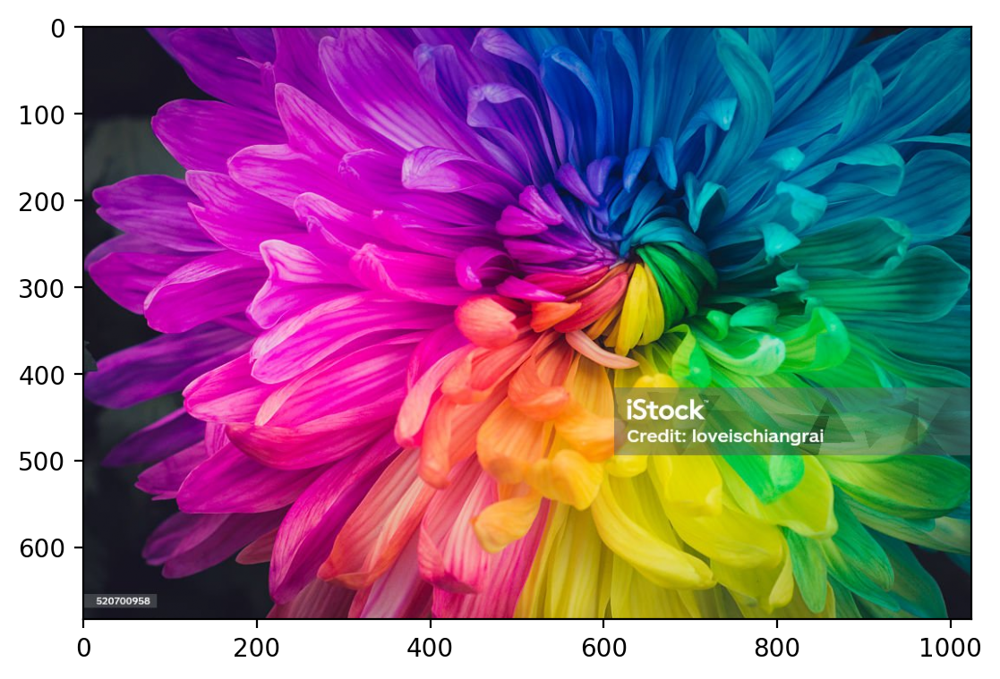

In [84]:
img_scaled = scaler.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled = torch.tensor(img_scaled)
print(img_scaled.shape)
plt.imshow(img_scaled.permute(1, 2, 0))

### Croppping the image

torch.Size([3, 400, 400])


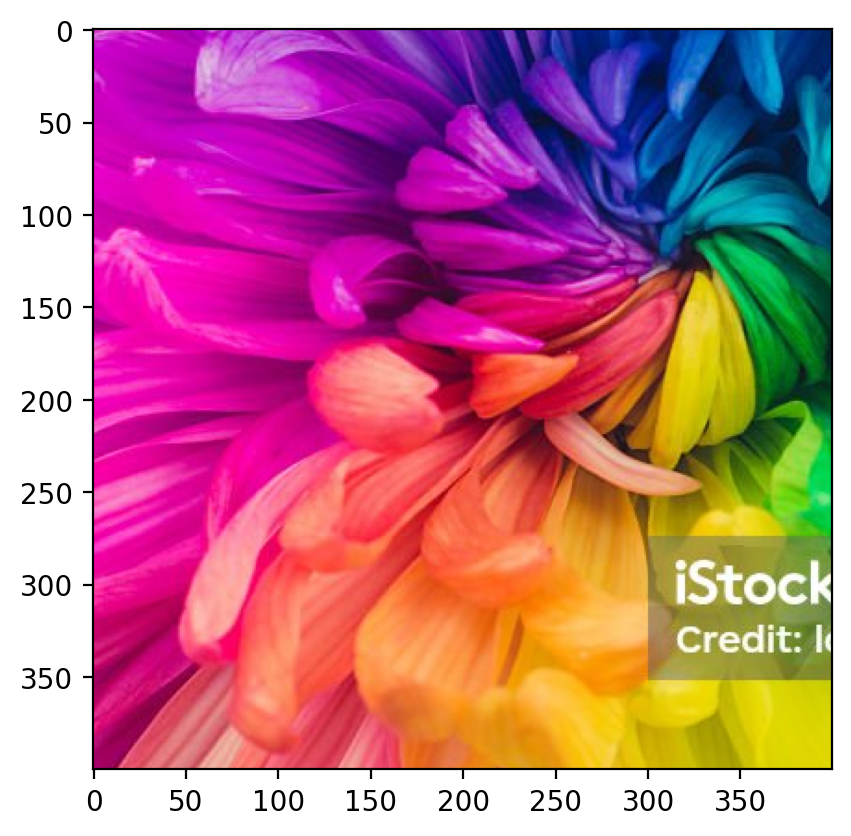

In [85]:
crop = torchvision.transforms.CenterCrop(400)
crop = crop(img_scaled)
print(crop.shape)
plt.imshow(crop.permute(1, 2, 0))

### Extract a 50x50 patch from the image

In [86]:
def extract_patch(crop, patch_size=50, top_left_x=0, top_left_y=0, border_color=torch.tensor([1.0, 0.0, 0.0]), border_thickness=1):
    channels, height, width = crop.shape

    if patch_size > height or patch_size > width:
        raise ValueError("Patch size must be smaller than the dimensions of the image.")

    patch = crop[:, top_left_x:top_left_x + patch_size, top_left_y:top_left_y + patch_size]

    img_with_border = crop.clone()
    img_with_border[:, top_left_x:top_left_x + border_thickness, top_left_y:top_left_y + patch_size] = border_color[:, None, None]
    img_with_border[:, top_left_x + patch_size - border_thickness:top_left_x + patch_size, top_left_y:top_left_y + patch_size] = border_color[:, None, None]
    img_with_border[:, top_left_x:top_left_x + patch_size, top_left_y:top_left_y + border_thickness] = border_color[:, None, None]
    img_with_border[:, top_left_x:top_left_x + patch_size, top_left_y + patch_size - border_thickness:top_left_y + patch_size] = border_color[:, None, None]

    print("Shape of the patch:", patch.shape)
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(rearrange(patch, 'c h w -> h w c').cpu().numpy())
    plt.title("Patch")
    plt.subplot(1, 2, 2)
    plt.imshow(rearrange(img_with_border, 'c h w -> h w c').cpu().numpy())
    plt.title("Image with border")
    plt.show()

    return patch, img_with_border



### HELPER Functions 

In [87]:
# -----------------------------------------------------
# 1. GRADIENT DESCENT BASED MATRIX FACTORIZATION
# -----------------------------------------------------
def matrix_factorization_gradient(image_tensor, r=20, lr=0.01, steps=5000, tol=1e-6, device=torch.device("cpu")):
    """
    Perform matrix factorization on masked image using gradient descent (Adam).

    Args:
        M (torch.Tensor): Masked image tensor of shape (C, H, W)
        r (int): Rank for low-rank approximation
        lr (float): Learning rate
        steps (int): Number of iterations
        tol (float): Tolerance for early stopping
        device (torch.device): CPU or CUDA device

    Returns:
        W_list (torch.Tensor): Factor matrix W (C, H, r)
        H_list (torch.Tensor): Factor matrix H (C, r, W)
        loss_list (list): Loss values per channel
    """
    C, H, W = image_tensor.shape
    image_tensor = image_tensor.to(device, dtype=torch.float32)

    W_list = torch.empty(C, H, r, device=device)
    H_list = torch.empty(C, r, W, device=device)
    loss_list = [[] for _ in range(C)]
    reconstructed_channels = []

    for c in range(C):
        M_channel = image_tensor[c].clone()

        # Initialize factors
        U = torch.rand(H, r, device=device, requires_grad=True)
        V = torch.rand(r, W, device=device, requires_grad=True)

        optimizer = optim.Adam([U, V], lr=lr)
        prev_loss = float('inf')

        for step in range(1, steps + 1):
            optimizer.zero_grad()

            M_pred = U @ V
            # M_pred_clamped = torch.clamp(U @ V, 0.0, 1.0)
            loss = F.mse_loss(M_pred, M_channel)

            loss.backward()
            optimizer.step()

            loss_list[c].append(loss.item())

            # Print occasionally
            if step % 1000 == 0:
                print(f"Channel {c}, Step {step}, Loss={loss.item():.6f}")

            # Early stop
            if abs(prev_loss - loss.item()) < tol:
                print(f"Channel {c} converged at step {step}, loss={loss.item():.6f}")
                break
            prev_loss = loss.item()

        W_list[c] = U.detach()
        H_list[c] = V.detach()
        reconstructed_channels.append((U @ V).detach())

    reconstructed_img = torch.stack(reconstructed_channels, dim=0)
    # reconstructed_img = torch.clamp(reconstructed_img, 0, 1)

    return reconstructed_img, W_list, H_list, loss_list


# -----------------------------------------------------
# 2. PLOT RESULTS
# -----------------------------------------------------
def plot_result(original_img, reconstructed_img, rank):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(f"Image Compression with Rank={rank}")

    # Original image
    axes[0].imshow(rearrange(original_img, 'c h w -> h w c').cpu().numpy())
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    # Reconstructed image
    axes[1].imshow(rearrange(reconstructed_img, 'c h w -> h w c').cpu().detach().numpy())
    axes[1].set_title("Compressed Image")
    axes[1].axis('off')

    plt.show()


# -----------------------------------------------------
# 3. RMSE + PSNR METRICS
# -----------------------------------------------------
def calculate_rmse_psnr(original_img, reconstructed_img):
    if original_img.device != reconstructed_img.device:
        original_img = original_img.to(reconstructed_img.device)

    mse = F.mse_loss(reconstructed_img, original_img)
    rmse = torch.sqrt(mse)
    psnr = 20 * torch.log10(1.0 / rmse)
    print(f"RMSE: {rmse.item():.6f}, PSNR: {psnr.item():.6f}")
    return rmse.item(), psnr.item()


# -----------------------------------------------------
# 4. FULL IMAGE RECONSTRUCTION PIPELINE
# -----------------------------------------------------
def image_reconstruction_matrix(img, rank=20, learning_rate=0.01, num_epochs=5000,
                                tol=1e-6, plot=True, device=torch.device("cpu")):
    img = img.to(torch.float32).to(device)
    
    # Perform matrix factorization
    # Compute metrics (without clamping)
    reconstructed_img, W, H, loss_list = matrix_factorization_gradient(
        img, r=rank, lr=learning_rate, steps=num_epochs, tol=tol, device=device
    )
    rmse, psnr = calculate_rmse_psnr(img, reconstructed_img)

    if plot:
        plot_result(img, reconstructed_img, rank)

    return reconstructed_img, W, H, loss_list, rmse, psnr


# -----------------------------------------------------
# 5. HELPER FUNCTION TO DISPLAY PATCHES
# -----------------------------------------------------
def display_patches(original, reconstructed, rank):
    fig, axs = plt.subplots(1, 2, figsize=(8, 8))
    axs[0].imshow(rearrange(original, 'c h w -> h w c').cpu().numpy())
    axs[0].set_title(f'Original Patch (rank={rank})')
    axs[1].imshow(rearrange(reconstructed, 'c h w -> h w c').cpu().detach().numpy())
    axs[1].set_title(f'Reconstructed Patch (rank={rank})')
    plt.show()

# -----------------------------------------------------
# 6. PLOT (RMSE AND PSNR) VS RANK TRENDS
# -----------------------------------------------------
def plot_rmse_psnr(ranks, rmse_values, psnr_values, patch_id):
    # Create subplots for RMSE and PSNR values
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Plot RMSE values
    axs[0].plot(ranks, rmse_values, marker='o', label='RMSE')
    axs[0].set_xlabel('Rank')
    axs[0].set_ylabel('RMSE')
    axs[0].set_title(f'RMSE values for Patch {patch_id}')
    axs[0].legend()
    axs[0].grid()

    # Plot PSNR values
    axs[1].plot(ranks, psnr_values, marker='o', label='PSNR')
    axs[1].set_xlabel('Rank')
    axs[1].set_ylabel('PSNR')
    axs[1].set_title(f'PSNR values for Patch {patch_id}')
    axs[1].legend()
    axs[1].grid()

    plt.tight_layout()
    plt.show()

# -----------------------------------------------------
# 7. ADD PATCH TO IMAGE
# -----------------------------------------------------
def add_patch_to_image(image_tensor, patch, top_left_x, top_left_y):
    channels, height, width = image_tensor.shape
    patch_size = patch.shape[1]

    if top_left_x + patch_size > height or top_left_y + patch_size > width:
        raise ValueError("Patch does not fit within the image dimensions.")

    image_with_patch = image_tensor.clone()
    image_with_patch[:, top_left_x:top_left_x + patch_size, top_left_y:top_left_y + patch_size] = patch

    fig, axs = plt.subplots(1, 2, figsize=(8, 8))
    axs[0].imshow(rearrange(image_tensor, 'c h w -> h w c').cpu().detach().numpy())
    axs[0].set_title("Original Image")
    axs[1].imshow(rearrange(image_with_patch, 'c h w -> h w c').cpu().detach().numpy())
    axs[1].set_title("Image with Patch")
    plt.show()

    return image_with_patch

## Patch Selection

____________________________________________________________________________________________________
Patch 1 with single color:
Shape of the patch: torch.Size([3, 50, 50])


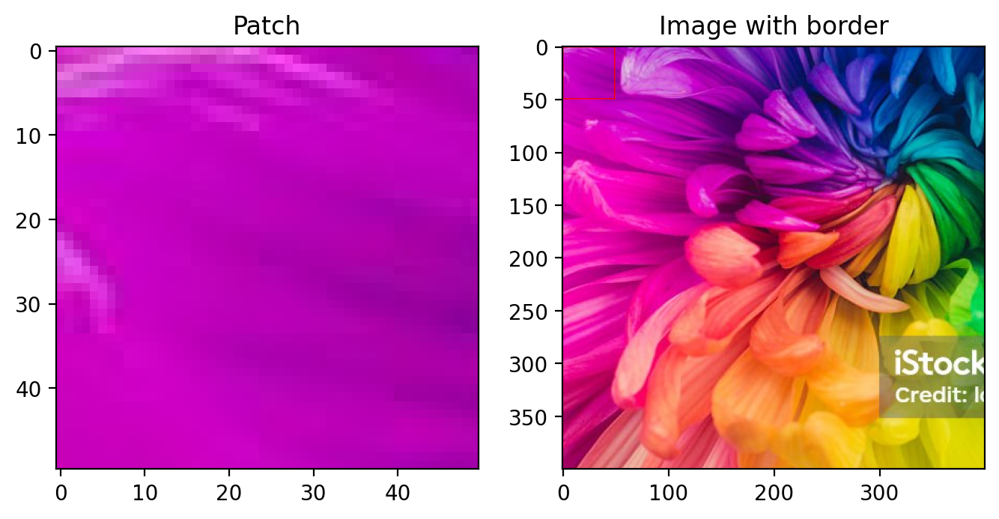

____________________________________________________________________________________________________
Patch 2 with 2 colors:
Shape of the patch: torch.Size([3, 50, 50])


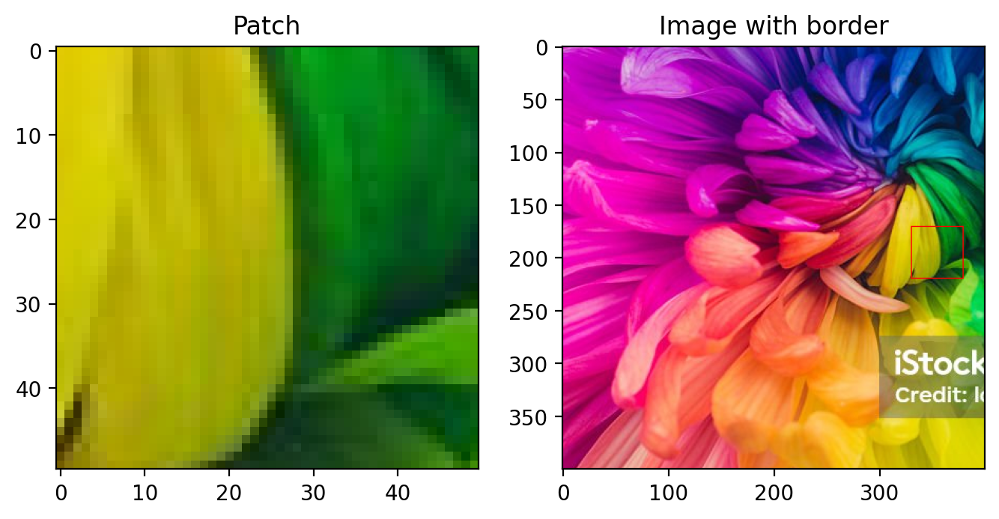

____________________________________________________________________________________________________
Patch 3 with 5+ colors:
Shape of the patch: torch.Size([3, 50, 50])


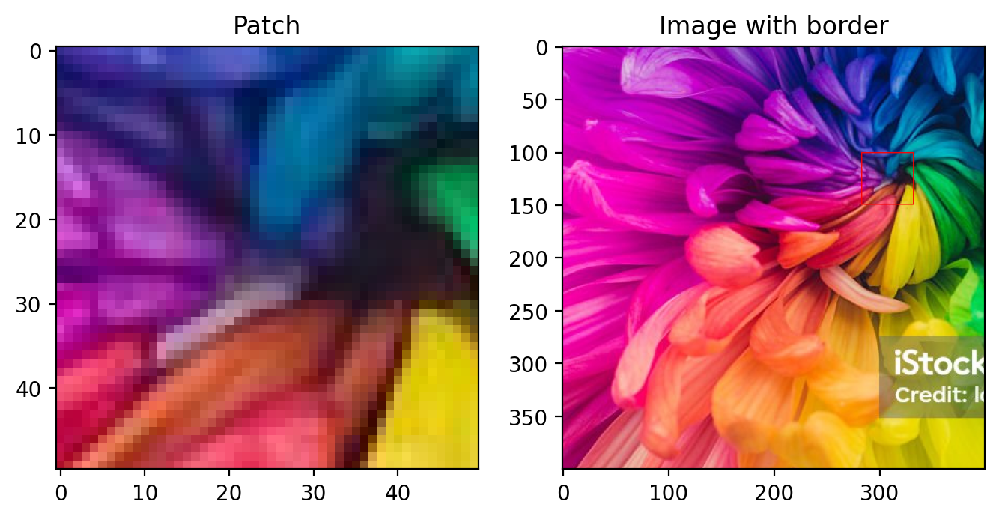

In [88]:
patch_size = 50
print("_" * 100)
print("Patch 1 with single color:")
patch1, img1 = extract_patch(crop, patch_size, top_left_x=0, top_left_y=0)      # Single-color
print("_" * 100)
print("Patch 2 with 2 colors:")
patch2, img2 = extract_patch(crop, patch_size, top_left_x=170, top_left_y=330)   # 2–3 colors
print("_" * 100)
print("Patch 3 with 5+ colors:")
patch3, img3 = extract_patch(crop, patch_size, top_left_x=100, top_left_y=283)  # 5+ colors

## Patch 1

____________________________________________________________________________________________________


Rank: 5
Channel 0 converged at step 538, loss=0.000615


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05866415..0.96756566].


Channel 1, Step 1000, Loss=0.000716
Channel 1 converged at step 1143, loss=0.000541
Channel 2 converged at step 383, loss=0.000890
RMSE: 0.026093, PSNR: 31.669529


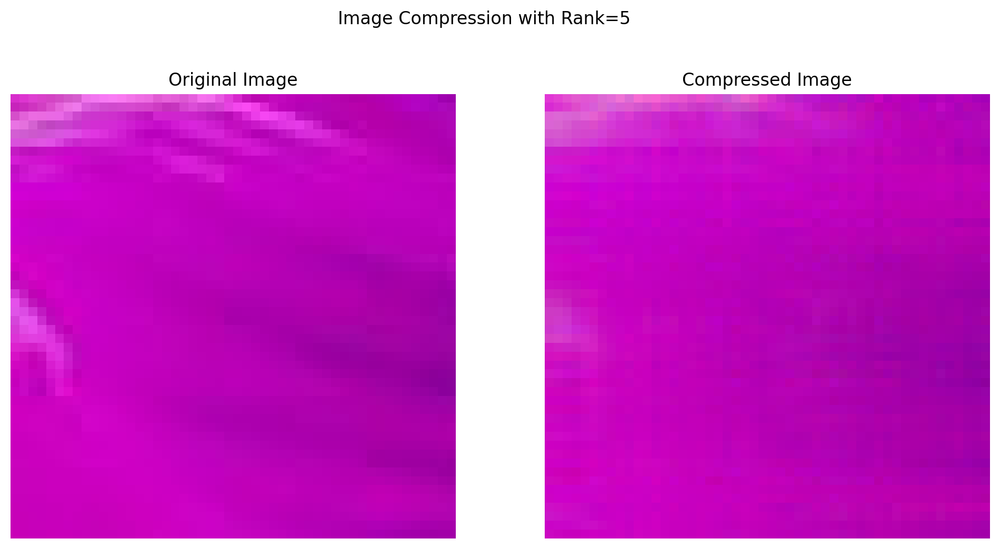

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05866415053606033..1.0].


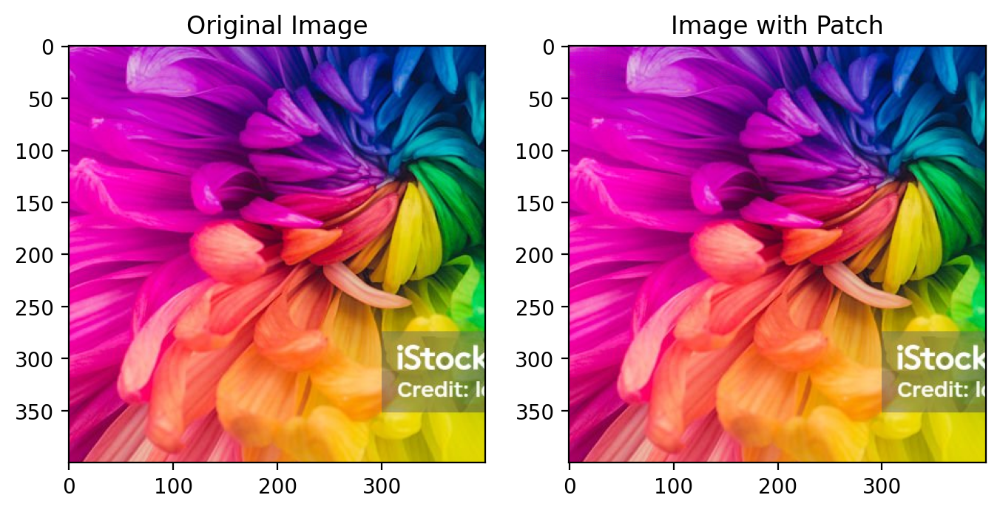

____________________________________________________________________________________________________


Rank: 10
Channel 0 converged at step 967, loss=0.000758
Channel 1, Step 1000, Loss=0.001186
Channel 1 converged at step 1397, loss=0.000662


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05947916..0.92217594].


Channel 2 converged at step 722, loss=0.000868
RMSE: 0.027598, PSNR: 31.182388


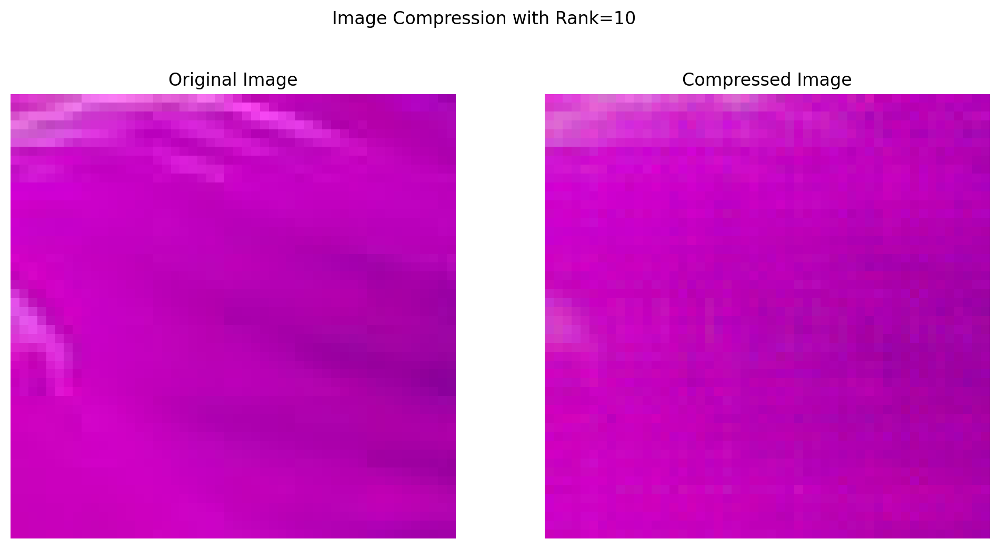

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059479158371686935..1.0].


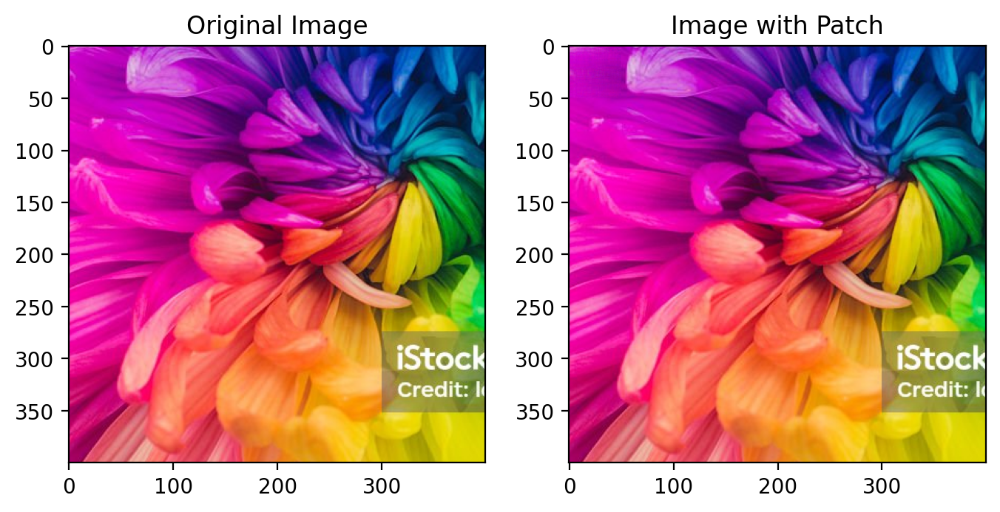

____________________________________________________________________________________________________


Rank: 25
Channel 0, Step 1000, Loss=0.001964
Channel 0 converged at step 1465, loss=0.000813
Channel 1, Step 1000, Loss=0.002316
Channel 1 converged at step 1605, loss=0.000721


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0895432..0.9660532].


Channel 2, Step 1000, Loss=0.001544
Channel 2 converged at step 1377, loss=0.000728
RMSE: 0.027443, PSNR: 31.231449


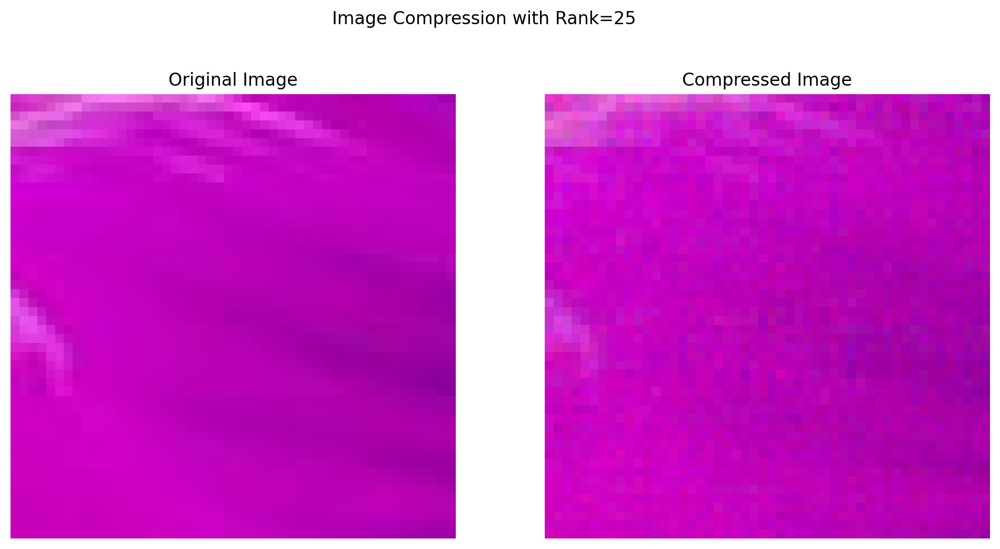

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08954320102930069..1.0].


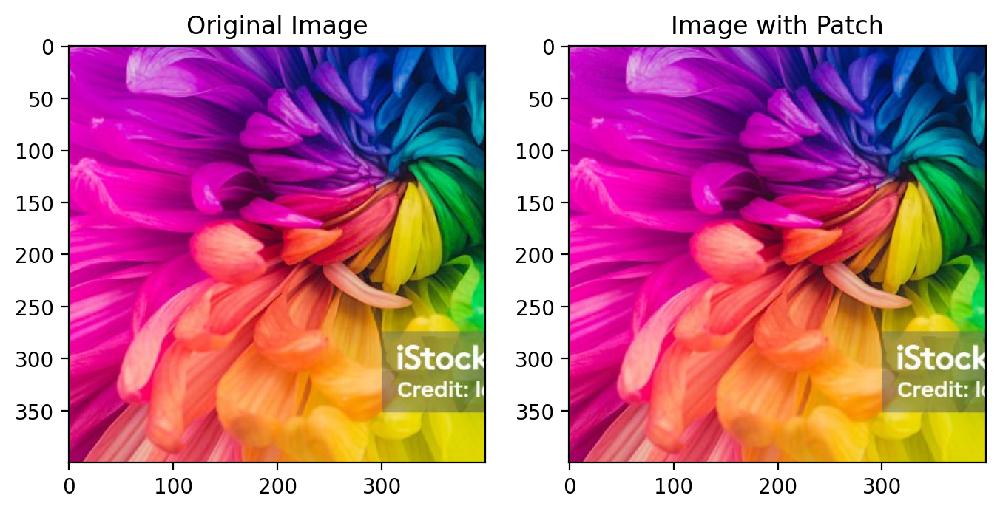

____________________________________________________________________________________________________


Rank: 50
Channel 0, Step 1000, Loss=0.006656
Channel 0, Step 2000, Loss=0.000628
Channel 0 converged at step 2007, loss=0.000621
Channel 1, Step 1000, Loss=0.008263
Channel 1, Step 2000, Loss=0.000919
Channel 1 converged at step 2207, loss=0.000664
Channel 2, Step 1000, Loss=0.007431


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09275755..0.97218025].


Channel 2, Step 2000, Loss=0.000763
Channel 2 converged at step 2106, loss=0.000644
RMSE: 0.025333, PSNR: 31.926271


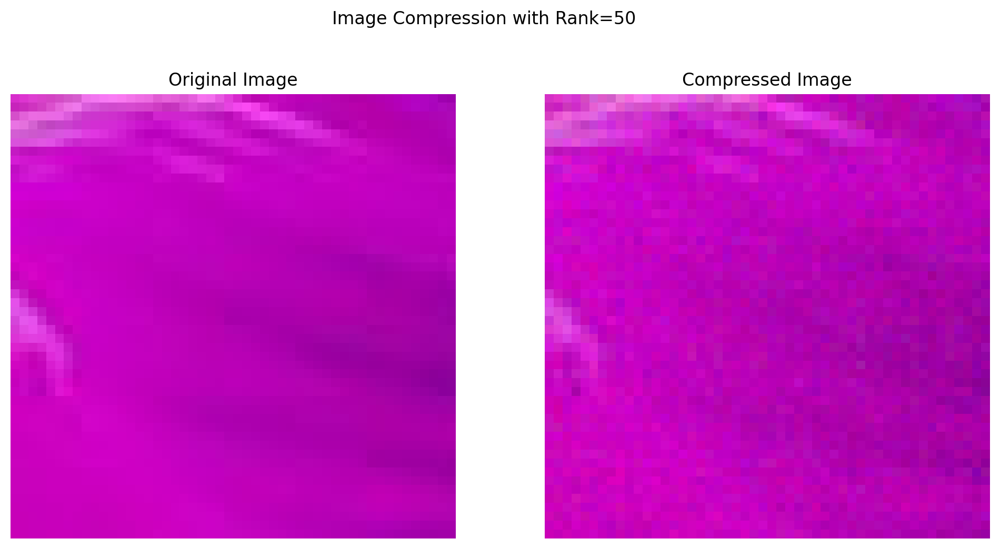

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09275755286216736..1.0].


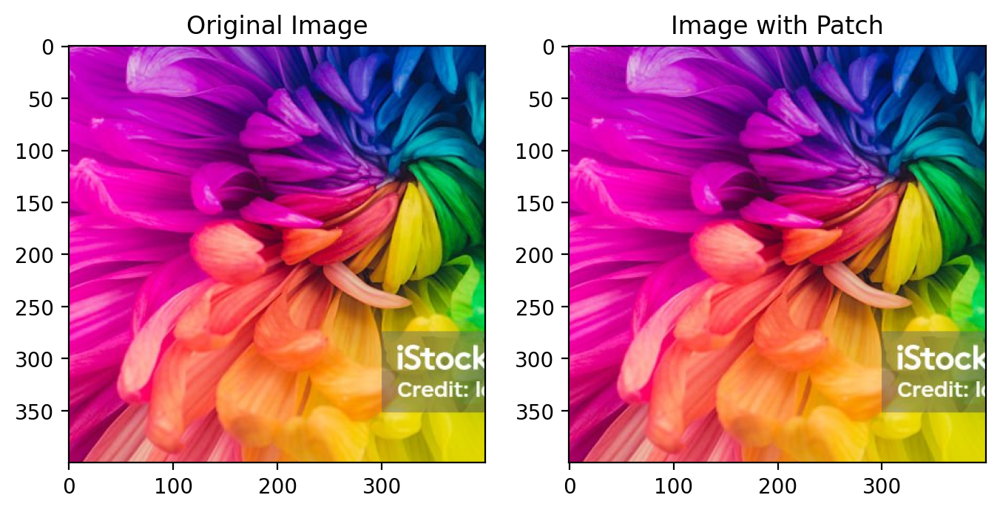

In [89]:
ranks = [5, 10, 25, 50]
rmse_values_1 = []
psnr_values_1 = []
reconstructed_patches_1 = {}   # to store results for each rank
reconstructed_full_images_1 = {}  # to store full image reconstructions

for rank in ranks:
    print("_" * 100)
    print(f"\n\nRank: {rank}")
    reconstructed_patch_1, W, H, loss_list, rmse_1, psnr_1 = image_reconstruction_matrix(
        patch1, rank=rank, learning_rate=1e-2, num_epochs=5000
    )
    reconstructed_patches_1[rank] = reconstructed_patch_1
    rmse_values_1.append(rmse_1)
    psnr_values_1.append(psnr_1)
    top_left_x, top_left_y = 0, 0
    img_with_patch_1 = add_patch_to_image(crop, reconstructed_patch_1, top_left_x, top_left_y)
    reconstructed_full_images_1[rank] = img_with_patch_1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05866415..0.96756566].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05947916..0.92217594].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0895432..0.9660532].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09275755..0.97218025].


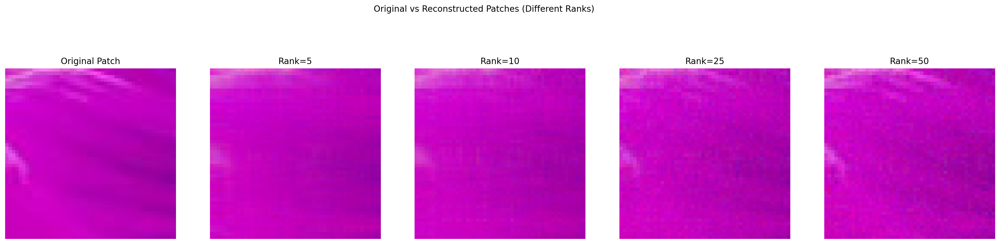

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05866415053606033..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059479158371686935..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08954320102930069..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09275755286216736..1.0].


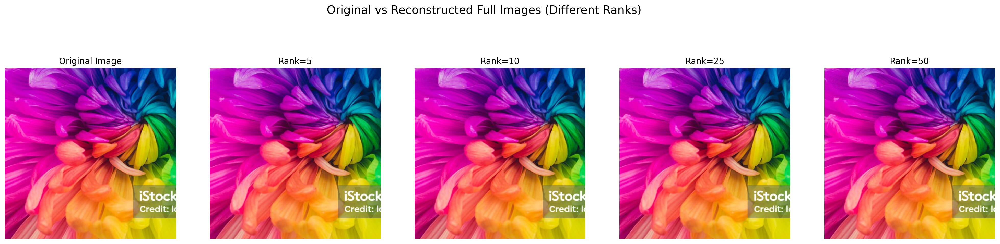

In [90]:
plt.figure(figsize=(25, 6))
plt.subplot(1, len(ranks)+1, 1)
plt.imshow(rearrange(patch1, 'c h w -> h w c').cpu().numpy())
plt.title("Original Patch")
plt.axis('off')

for i, rank in enumerate(ranks):
    plt.subplot(1, len(ranks)+1, i+2)
    plt.imshow(rearrange(reconstructed_patches_1[rank], 'c h w -> h w c').cpu().detach().numpy())
    plt.title(f"Rank={rank}")
    plt.axis('off')

plt.suptitle("Original vs Reconstructed Patches (Different Ranks)")
plt.show()



plt.figure(figsize=(25, 6))

# 1️⃣ Original full image
plt.subplot(1, len(ranks) + 1, 1)
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
plt.title("Original Image")
plt.axis('off')

# 2️⃣ Reconstructed full images for each rank
for i, rank in enumerate(ranks):
    plt.subplot(1, len(ranks) + 1, i + 2)
    plt.imshow(rearrange(reconstructed_full_images_1[rank], 'c h w -> h w c').cpu().detach().numpy())
    plt.title(f"Rank={rank}")
    plt.axis('off')

plt.suptitle("Original vs Reconstructed Full Images (Different Ranks)", fontsize=16)
plt.show()




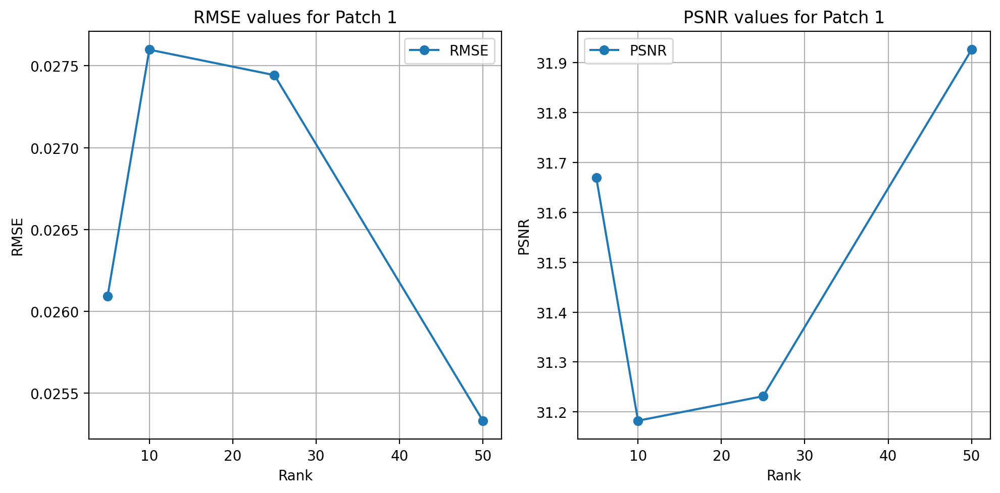

In [91]:
plot_rmse_psnr(ranks, rmse_values_1, psnr_values_1, patch_id=1)

## Patch-2

____________________________________________________________________________________________________


Rank: 5
Channel 0, Step 1000, Loss=0.001506
Channel 0 converged at step 1148, loss=0.001305


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047862686..0.92735773].


Channel 1 converged at step 934, loss=0.001807
Channel 2 converged at step 575, loss=0.000945
RMSE: 0.036759, PSNR: 28.692768


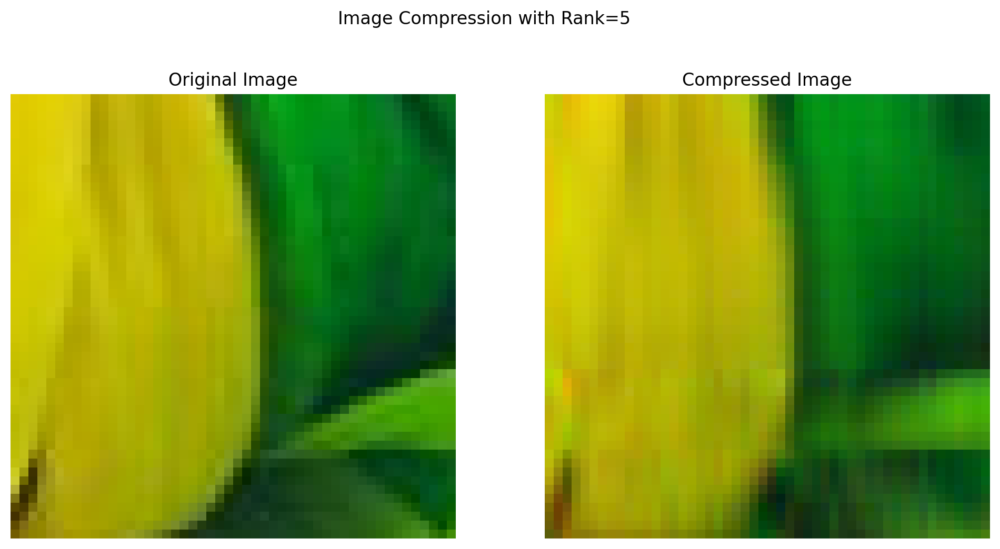

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04786268621683121..1.0].


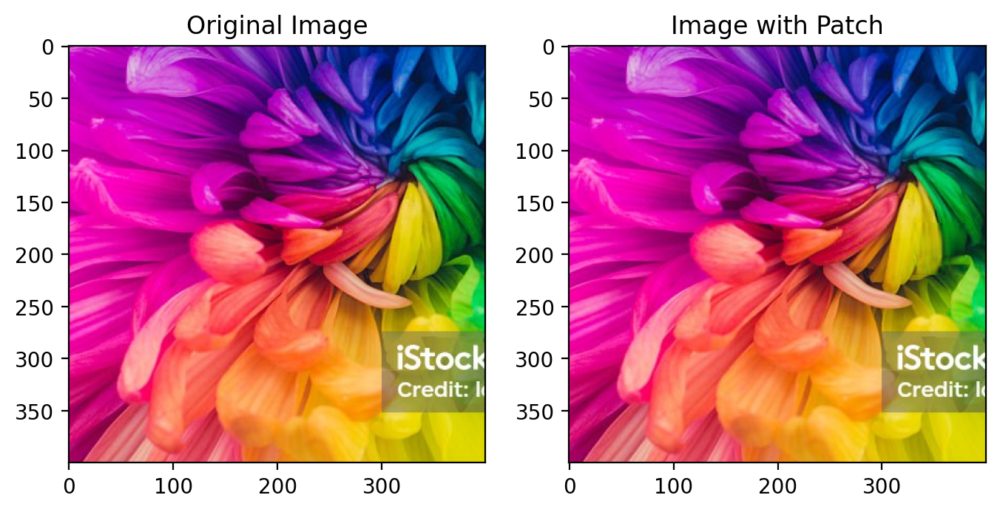

____________________________________________________________________________________________________


Rank: 10
Channel 0, Step 1000, Loss=0.001783
Channel 0 converged at step 1517, loss=0.001053
Channel 1, Step 1000, Loss=0.002498
Channel 1 converged at step 1602, loss=0.001063


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06753179..0.9366547].


Channel 2 converged at step 985, loss=0.000977
RMSE: 0.032091, PSNR: 29.872330


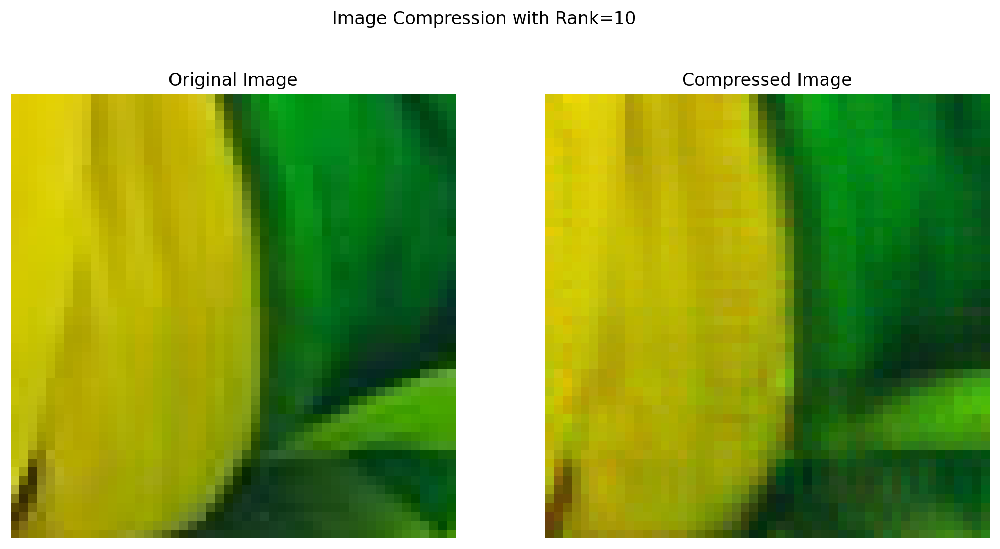

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06753178685903549..1.0].


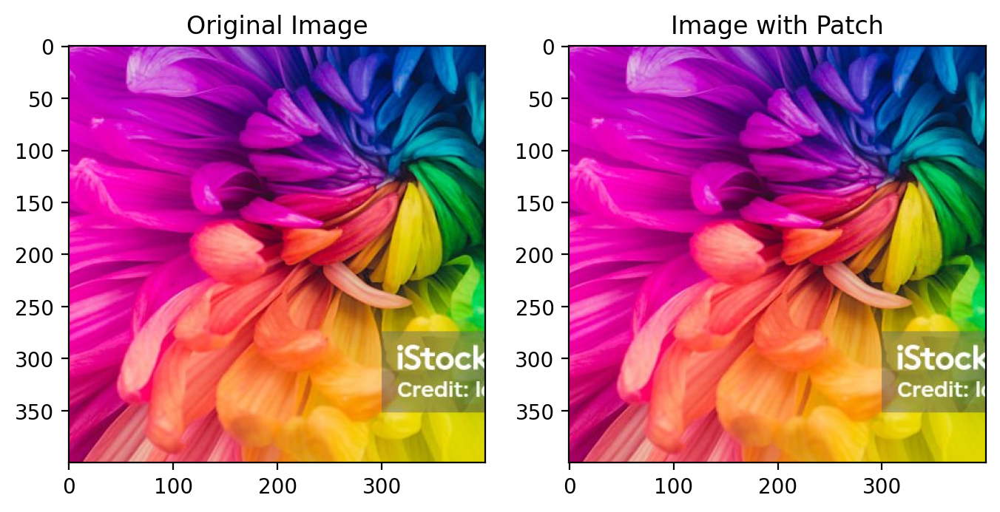

____________________________________________________________________________________________________


Rank: 25
Channel 0, Step 1000, Loss=0.004066
Channel 0 converged at step 1860, loss=0.000956
Channel 1, Step 1000, Loss=0.004598
Channel 1, Step 2000, Loss=0.000916
Channel 1 converged at step 2022, loss=0.000894


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06216677..0.9331778].


Channel 2, Step 1000, Loss=0.002515
Channel 2 converged at step 1582, loss=0.000782
RMSE: 0.029598, PSNR: 30.574768


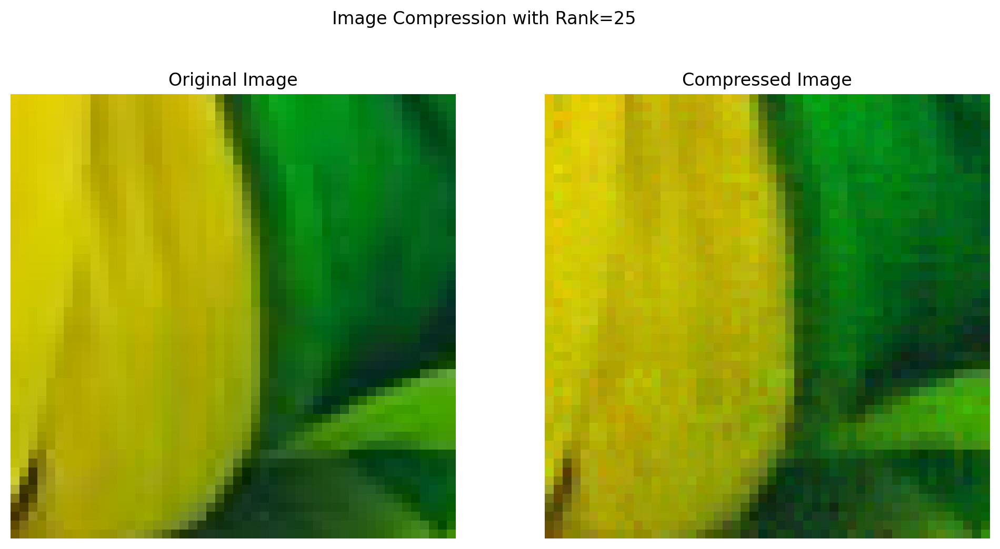

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06216676905751228..1.0].


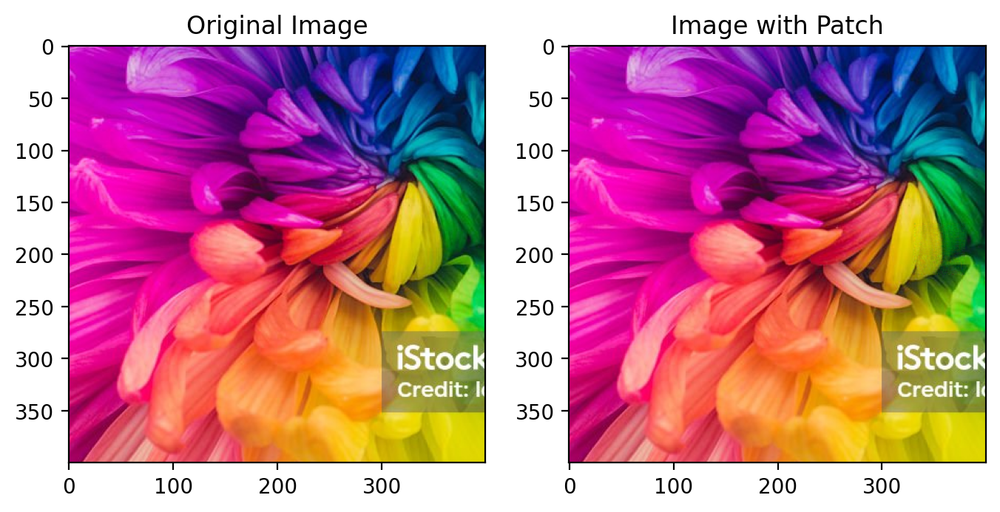

____________________________________________________________________________________________________


Rank: 50
Channel 0, Step 1000, Loss=0.009900
Channel 0, Step 2000, Loss=0.001348
Channel 0 converged at step 2374, loss=0.000798
Channel 1, Step 1000, Loss=0.009104
Channel 1, Step 2000, Loss=0.001373
Channel 1 converged at step 2404, loss=0.000801
Channel 2, Step 1000, Loss=0.008447


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08049348..0.9363485].


Channel 2, Step 2000, Loss=0.000841
Channel 2 converged at step 2159, loss=0.000650
RMSE: 0.027360, PSNR: 31.257809


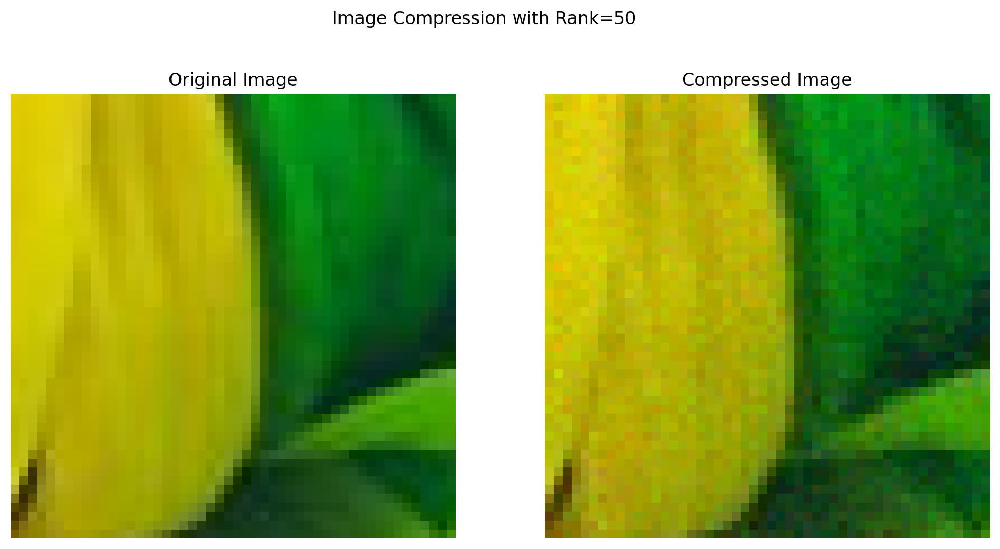

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08049347996711731..1.0].


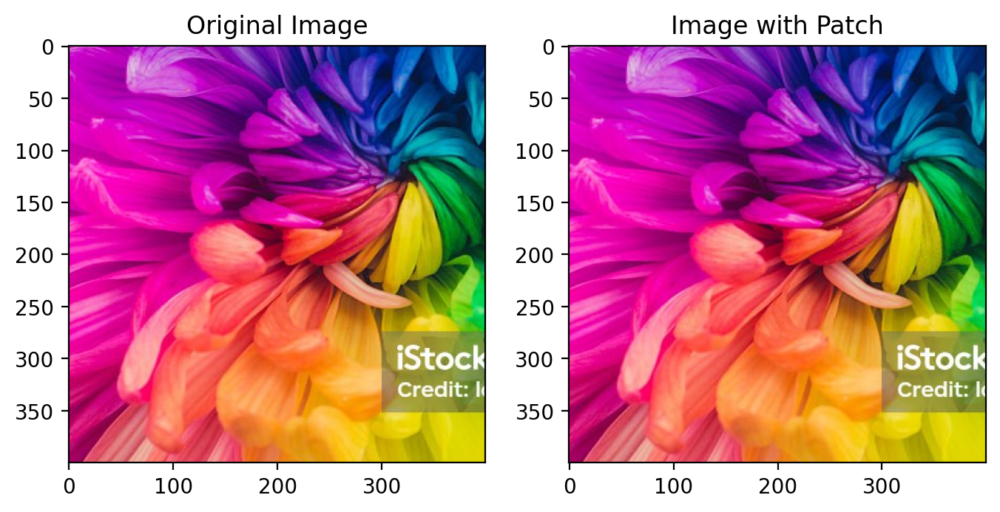

In [92]:
ranks = [5, 10, 25, 50]
rmse_values_2 = []
psnr_values_2 = []
reconstructed_patches_2 = {}   # to store results for each rank
reconstructed_full_images_2 = {}  # to store full image reconstructions
for rank in ranks:
    print("_" * 100)
    print(f"\n\nRank: {rank}")
    reconstructed_patch_2, W, H, loss_list, rmse_2, psnr_2 = image_reconstruction_matrix(
        patch2, rank=rank, learning_rate=1e-2, num_epochs=5000
    )
    reconstructed_patches_2[rank] = reconstructed_patch_2
    rmse_values_2.append(rmse_2)
    psnr_values_2.append(psnr_2)
    top_left_x, top_left_y = 170, 330
    img_with_patch_2 = add_patch_to_image(crop, reconstructed_patch_2, top_left_x, top_left_y)
    reconstructed_full_images_2[rank] = img_with_patch_2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047862686..0.92735773].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06753179..0.9366547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06216677..0.9331778].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08049348..0.9363485].


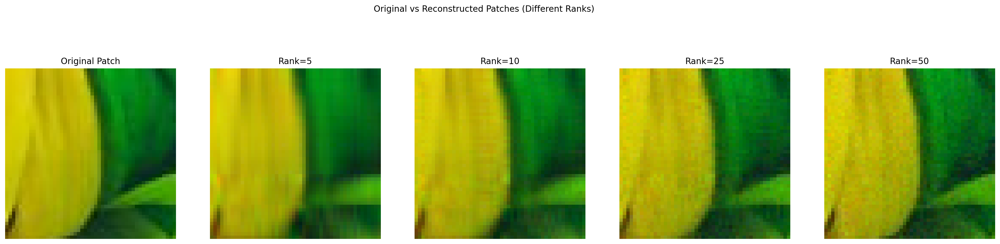

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04786268621683121..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06753178685903549..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06216676905751228..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08049347996711731..1.0].


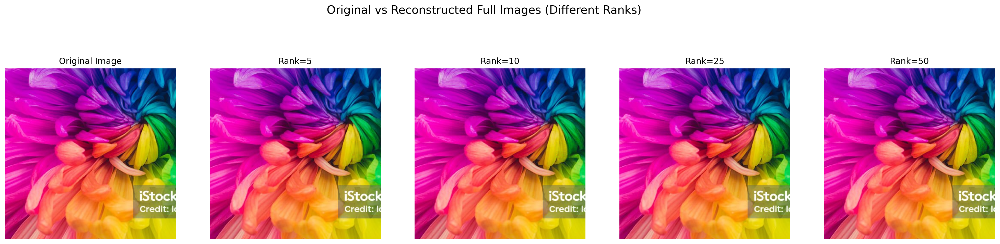

In [93]:
plt.figure(figsize=(25, 6))
plt.subplot(1, len(ranks)+1, 1)
plt.imshow(rearrange(patch2, 'c h w -> h w c').cpu().numpy())
plt.title("Original Patch")
plt.axis('off')

for i, rank in enumerate(ranks):
    plt.subplot(1, len(ranks)+1, i+2)
    plt.imshow(rearrange(reconstructed_patches_2[rank], 'c h w -> h w c').cpu().detach().numpy())
    plt.title(f"Rank={rank}")
    plt.axis('off')

plt.suptitle("Original vs Reconstructed Patches (Different Ranks)")
plt.show()


plt.figure(figsize=(25, 6))

# 1️⃣ Original full image
plt.subplot(1, len(ranks) + 1, 1)
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
plt.title("Original Image")
plt.axis('off')

# 2️⃣ Reconstructed full images for each rank
for i, rank in enumerate(ranks):
    plt.subplot(1, len(ranks) + 1, i + 2)
    plt.imshow(rearrange(reconstructed_full_images_2[rank], 'c h w -> h w c').cpu().detach().numpy())
    plt.title(f"Rank={rank}")
    plt.axis('off')

plt.suptitle("Original vs Reconstructed Full Images (Different Ranks)", fontsize=16)
plt.show()


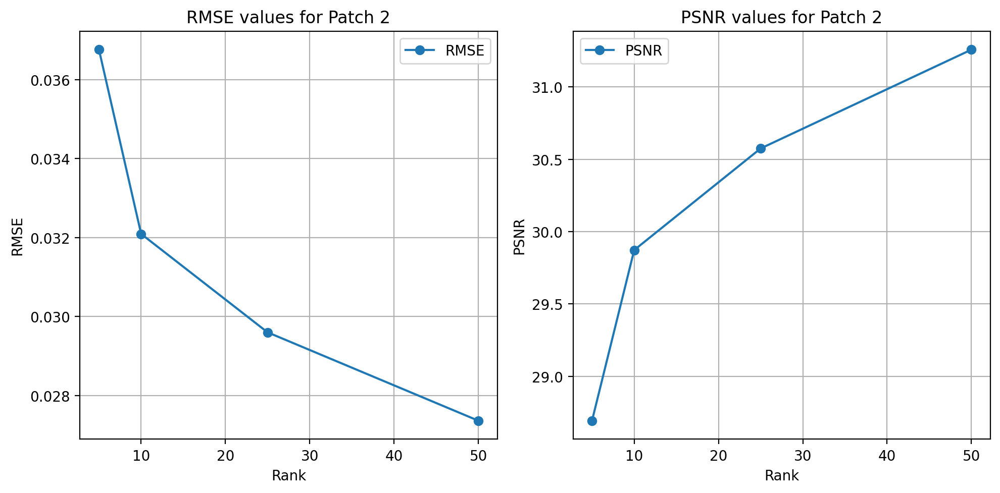

In [94]:
plot_rmse_psnr(ranks, rmse_values_2, psnr_values_2, patch_id=2)

## Patch-3

____________________________________________________________________________________________________


Rank: 5
Channel 0, Step 1000, Loss=0.003771
Channel 0 converged at step 1012, loss=0.003759
Channel 1, Step 1000, Loss=0.005688
Channel 1 converged at step 1195, loss=0.005292


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07414706..1.047014].


Channel 2, Step 1000, Loss=0.003455
Channel 2 converged at step 1012, loss=0.003443
RMSE: 0.064527, PSNR: 23.805189


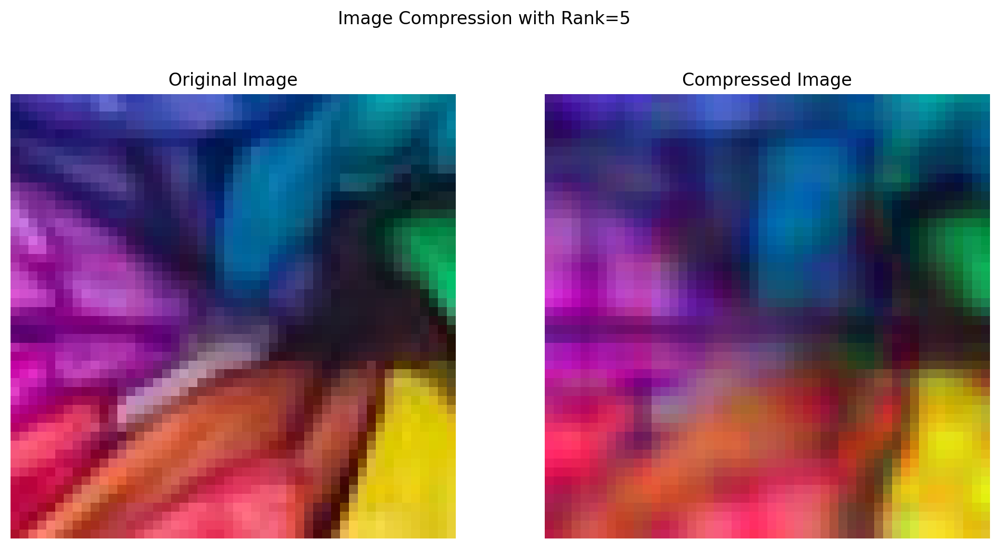

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0741470605134964..1.0470139980316162].


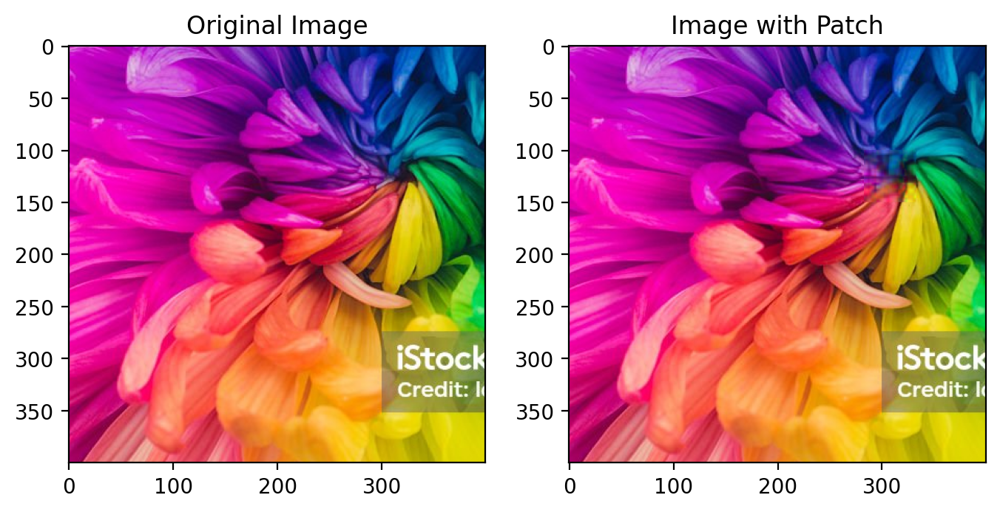

____________________________________________________________________________________________________


Rank: 10
Channel 0, Step 1000, Loss=0.003362
Channel 0 converged at step 1673, loss=0.001388
Channel 1, Step 1000, Loss=0.004855
Channel 1 converged at step 1896, loss=0.001753


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08343879..1.0083421].


Channel 2, Step 1000, Loss=0.003321
Channel 2 converged at step 1661, loss=0.001417
RMSE: 0.038967, PSNR: 28.186138


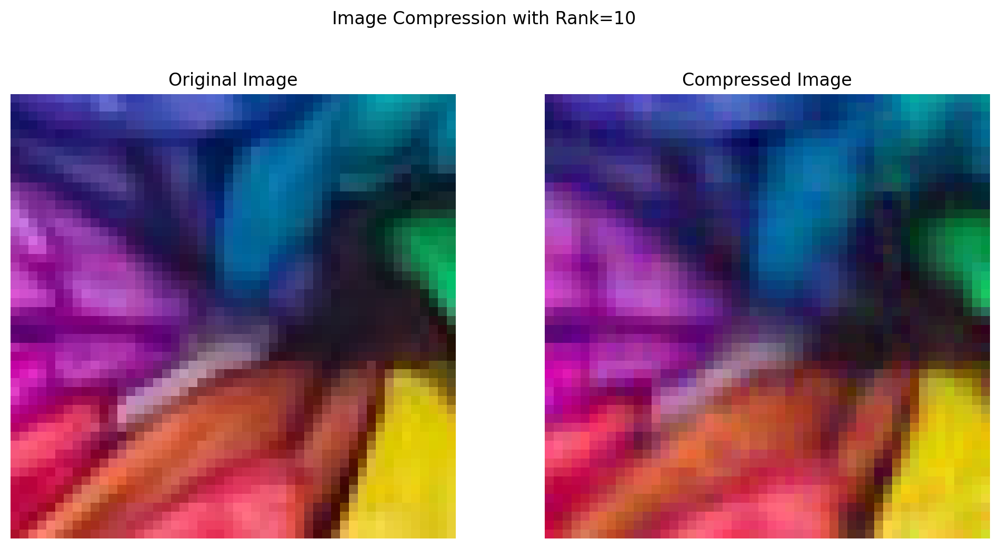

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08343879133462906..1.0083421468734741].


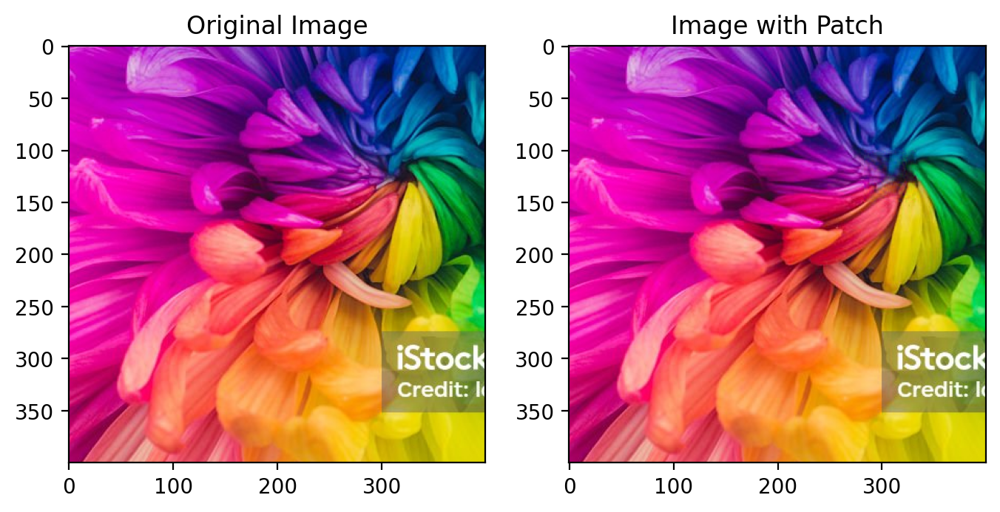

____________________________________________________________________________________________________


Rank: 25
Channel 0, Step 1000, Loss=0.005227
Channel 0, Step 2000, Loss=0.001549
Channel 0 converged at step 2430, loss=0.001001
Channel 1, Step 1000, Loss=0.007270
Channel 1, Step 2000, Loss=0.001502
Channel 1 converged at step 2342, loss=0.001011
Channel 2, Step 1000, Loss=0.006039


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059526715..1.0137945].


Channel 2, Step 2000, Loss=0.001517
Channel 2 converged at step 2341, loss=0.001101
RMSE: 0.032201, PSNR: 29.842598


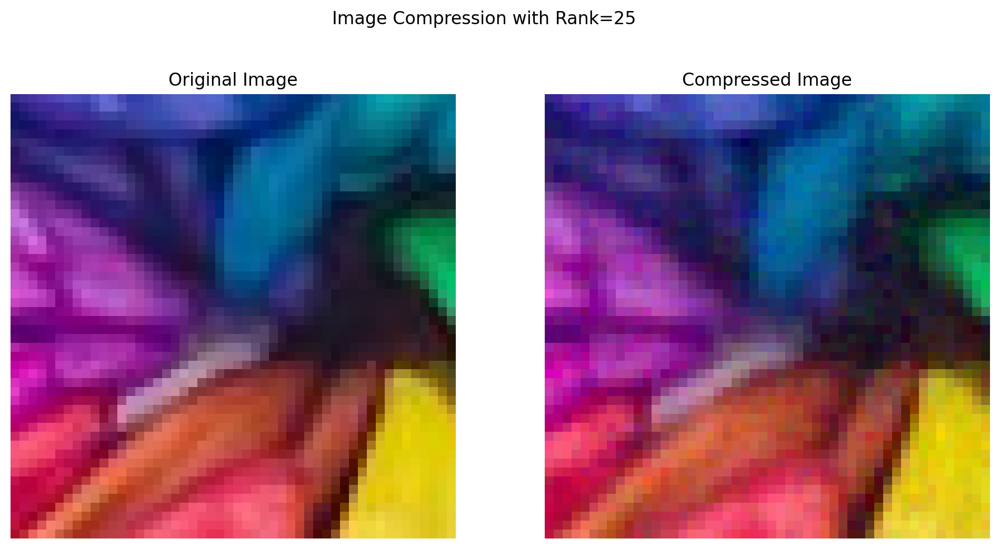

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0595267154276371..1.0137945413589478].


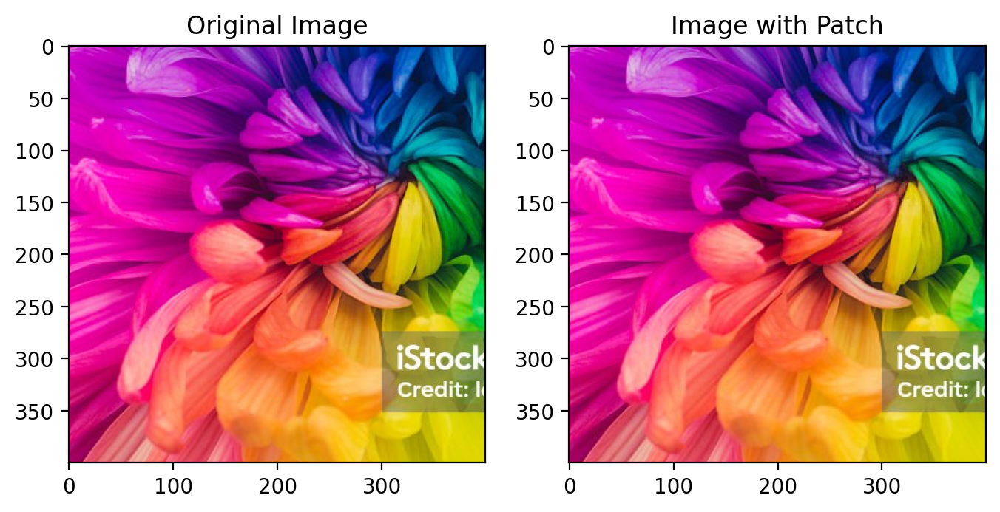

____________________________________________________________________________________________________


Rank: 50
Channel 0, Step 1000, Loss=0.009550
Channel 0, Step 2000, Loss=0.001513
Channel 0 converged at step 2411, loss=0.000945
Channel 1, Step 1000, Loss=0.010726
Channel 1, Step 2000, Loss=0.001750
Channel 1 converged at step 2558, loss=0.000893
Channel 2, Step 1000, Loss=0.010919
Channel 2, Step 2000, Loss=0.001645
Channel 2 converged at step 2464, loss=0.000950
RMSE: 0.030468, PSNR: 30.323145


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07291956..1.0257292].


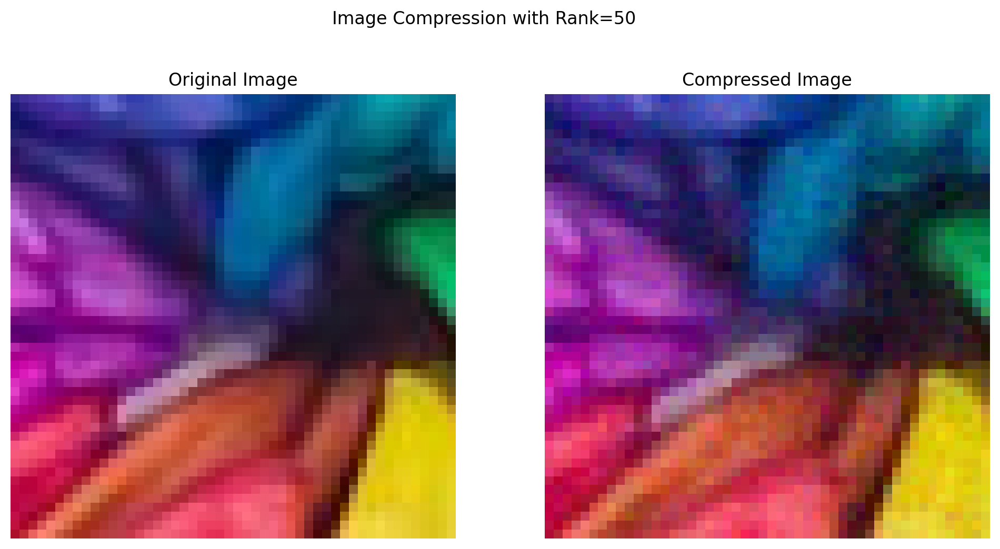

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.072919562458992..1.0257291793823242].


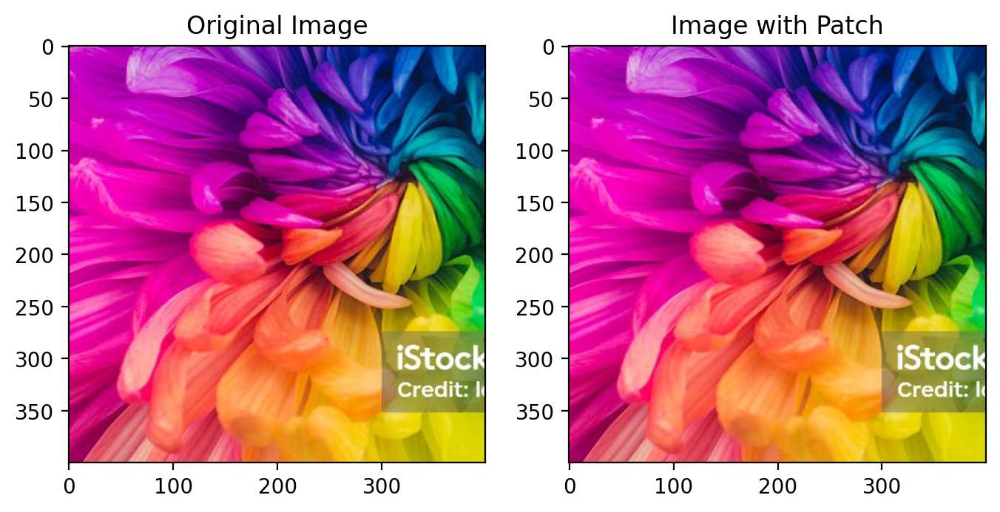

In [95]:
ranks = [5, 10, 25, 50]
rmse_values_3 = []
psnr_values_3 = []
reconstructed_patches_3 = {}   # to store results for each rank
reconstructed_full_images_3 = {}  # to store full image reconstructions
for rank in ranks:
    print("_" * 100)
    print(f"\n\nRank: {rank}")
    reconstructed_patch_3, W, H, loss_list, rmse_3, psnr_3 = image_reconstruction_matrix(
        patch3, rank=rank, learning_rate=1e-2, num_epochs=5000
    )
    reconstructed_patches_3[rank] = reconstructed_patch_3
    
    rmse_values_3.append(rmse_3)
    psnr_values_3.append(psnr_3)
    top_left_x, top_left_y = 100, 283
    img_with_patch_3 = add_patch_to_image(crop, reconstructed_patch_3, top_left_x, top_left_y)
    reconstructed_full_images_3[rank] = img_with_patch_3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07414706..1.047014].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08343879..1.0083421].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059526715..1.0137945].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07291956..1.0257292].


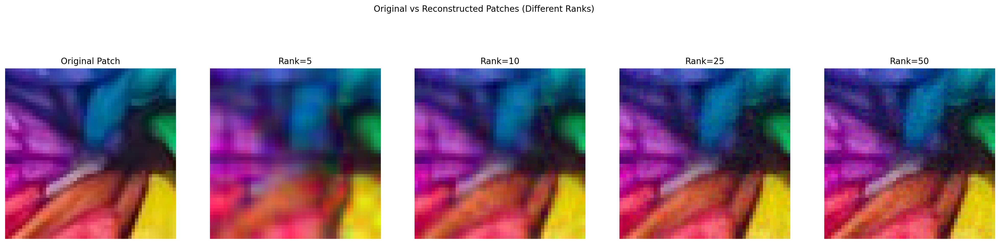

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0741470605134964..1.0470139980316162].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08343879133462906..1.0083421468734741].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0595267154276371..1.0137945413589478].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.072919562458992..1.0257291793823242].


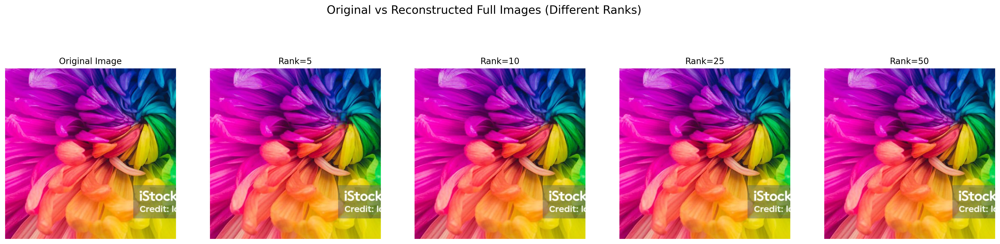

In [96]:
plt.figure(figsize=(25, 6))
plt.subplot(1, len(ranks)+1, 1)
plt.imshow(rearrange(patch3, 'c h w -> h w c').cpu().numpy())
plt.title("Original Patch")
plt.axis('off')

for i, rank in enumerate(ranks):
    plt.subplot(1, len(ranks)+1, i+2)
    plt.imshow(rearrange(reconstructed_patches_3[rank], 'c h w -> h w c').cpu().detach().numpy())
    plt.title(f"Rank={rank}")
    plt.axis('off')

plt.suptitle("Original vs Reconstructed Patches (Different Ranks)")
plt.show()


plt.figure(figsize=(25, 6))

# 1️⃣ Original full image
plt.subplot(1, len(ranks) + 1, 1)
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
plt.title("Original Image")
plt.axis('off')

# 2️⃣ Reconstructed full images for each rank
for i, rank in enumerate(ranks):
    plt.subplot(1, len(ranks) + 1, i + 2)
    plt.imshow(rearrange(reconstructed_full_images_3[rank], 'c h w -> h w c').cpu().detach().numpy())
    plt.title(f"Rank={rank}")
    plt.axis('off')

plt.suptitle("Original vs Reconstructed Full Images (Different Ranks)", fontsize=16)
plt.show()


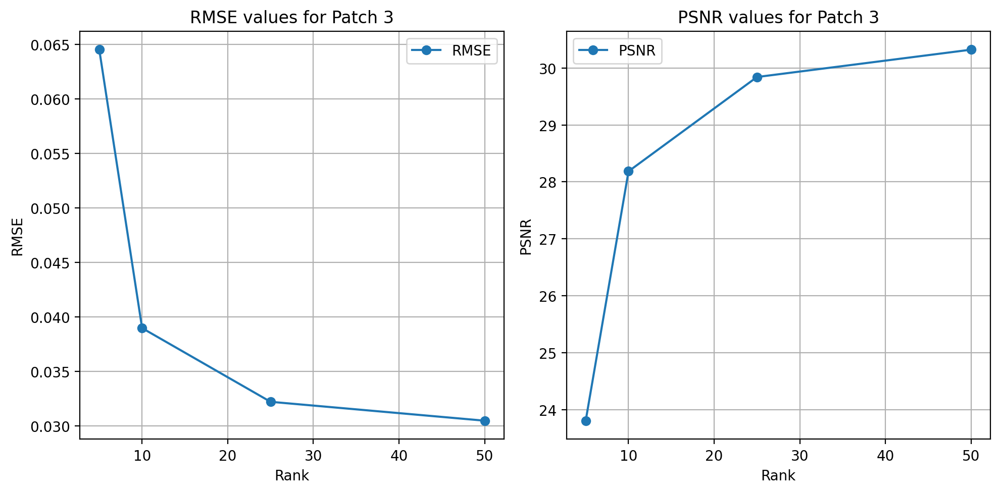

In [97]:
plot_rmse_psnr(ranks, rmse_values_3, psnr_values_3, patch_id=3)

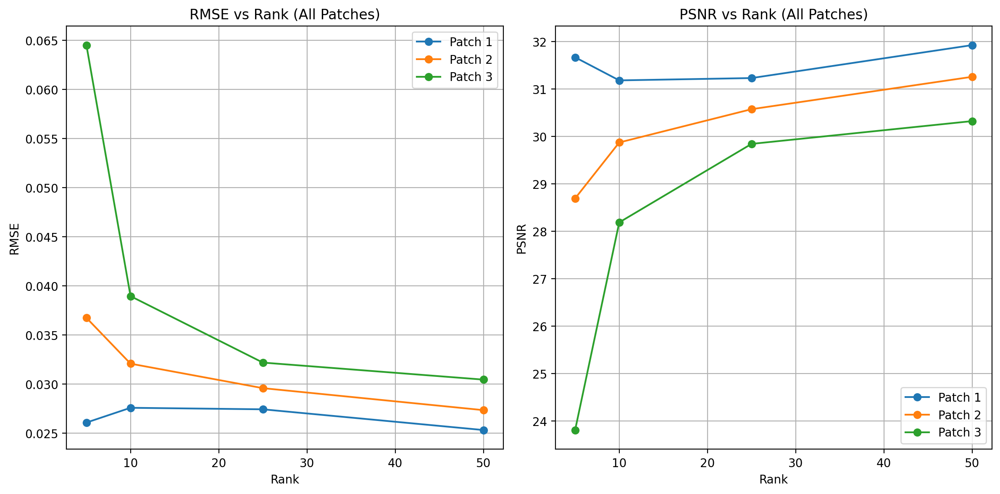

In [98]:
def plot_rmse_psnr_multiple_patches(ranks, rmse_values_list, psnr_values_list, patch_ids):
    """
    Plot RMSE and PSNR vs Rank for multiple patches on the same graphs.
    
    Args:
        ranks (list): List of ranks used for compression.
        rmse_values_list (list of lists): RMSE values for each patch (e.g. [rmse_patch1, rmse_patch2, rmse_patch3])
        psnr_values_list (list of lists): PSNR values for each patch.
        patch_ids (list): List of patch IDs (for legends).
    """
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    # Plot RMSE for all patches
    for rmse_values, pid in zip(rmse_values_list, patch_ids):
        axs[0].plot(ranks, rmse_values, marker='o', label=f'Patch {pid}')
    axs[0].set_xlabel('Rank')
    axs[0].set_ylabel('RMSE')
    axs[0].set_title('RMSE vs Rank (All Patches)')
    axs[0].legend()
    axs[0].grid()

    # Plot PSNR for all patches
    for psnr_values, pid in zip(psnr_values_list, patch_ids):
        axs[1].plot(ranks, psnr_values, marker='o', label=f'Patch {pid}')
    axs[1].set_xlabel('Rank')
    axs[1].set_ylabel('PSNR')
    axs[1].set_title('PSNR vs Rank (All Patches)')
    axs[1].legend()
    axs[1].grid()

    plt.tight_layout()
    plt.show()

# Plot RMSE and PSNR trends for all patches together

plot_rmse_psnr_multiple_patches(
    ranks,
    [rmse_values_1, rmse_values_2, rmse_values_3],
    [psnr_values_1, psnr_values_2, psnr_values_3],
    patch_ids=[1, 2, 3]
)




## Observations: Data Compression using Low-Rank Matrix Factorization

### 1. Single-Color Patch
- The patch contains only one dominant color, so pixel values are highly correlated.  
- Even with a **low rank (r = 5)**, the reconstructed image looks almost identical to the original patch.  
- Increasing rank beyond 10 does **not significantly improve** visual quality or RMSE/PSNR.  
- **Observation:** Low-rank factorization performs very well for uniform regions since the information content is minimal.

---

### 2. Patch with 2–3 Colors
- Here, pixel variations are more noticeable than in the single-color case.  
- For **r = 5**, there is visible **blurring or color mixing** at boundaries.  
- As the rank increases (**r = 10 → 25 → 50**), edges become sharper and colors are more distinct.  
- **Observation:** A moderate rank (around 25) provides a good trade-off between compression and quality.

---

### 3. Patch with 5 or More Colors
- These patches have **high-frequency details** and **greater color variation**.  
- For low ranks (**r = 5, 10**), the reconstruction appears **blurred** and loses fine details.  
- Increasing rank to **25 or 50** recovers much of the structure, with significantly lower RMSE and higher PSNR.  
- **Observation:** Complex image regions require higher ranks for accurate reconstruction.

---

### 4. General Trend

| Rank (r) | RMSE ↓ | PSNR ↑ | Visual Quality | Compression Ratio |
|-----------|---------|---------|----------------|------------------|
| 5         | High error | Low | Blurry / Smoothed | Very High (Best Compression) |
| 10        | Moderate error | Medium | Fairly clear | High |
| 25        | Low error | High | Sharp and clear | Moderate |
| 50        | Very low error | Very high | Nearly identical | Low (Least Compression) |

- **Higher rank →** better reconstruction but less compression.  
- **Lower rank →** higher compression but reduced quality.

---

### Conclusion
- Low-rank matrix factorization compresses images effectively by representing them with fewer parameters.  
- The **optimal rank** depends on the **complexity** of the patch: smoother regions need smaller ranks, while detailed regions need larger ranks.  
- This illustrates the fundamental trade-off between **data compression** and **reconstruction accuracy**.


